In [1]:
#packages
import requests
import pandas as pd
import json
from glob import glob
from pathlib import Path
import csv
import numpy as np
import matplotlib.pyplot as plt

# This is the download section (old)

Doing json files one by one due to the download limit.

In [29]:
#pulling in the list of ECONET parameters I will use
ECONET_var_df = pd.read_excel('/Users/JChuang/Documents/3S MP/MP/ECONET_variables.xlsx')
ECONET_vars = ECONET_var_df['ECONET Parameter Code']
var_csv = ','.join(ECONET_var_df['ECONET Parameter Code'].dropna().astype(str))
var_csv


'airtemp,dewtemp,wbgtavg,heatindex2m,windchill,rh,ob,precip,soilmoist20cm,city,cooldegday2m,heatdegday2m,gustdir,gustspeed,uwind10m,vwind10m,winddir,windspeed10m'

In [ ]:
import requests

#parameters
params = {
    'hash': '4537198f12f41e618faddc60a48d23186912c15f',
    #'loc': 'state=NC; type = ECONET',
    'loc': 'state=NC; type=ECONET',
    "var": 'precip',
    "start": "2025-05-28",
    "end": "2025-09-10",
    "output": "json",
    "obtype": "H" #maybe we change this to every 3 hours?
}

#Send request
url = "https://api.climate.ncsu.edu/data"
response = requests.get(url,params=params)

weather_data = response.json()
print(weather_data)

{'status': {'code': 200, 'status': 'OK', 'errors': [], 'messages': ['Multiple types or values may be joined with +', 'Values may be coded as: MV = Missing Value, NA = Not Available, QCF = Value Fails QC, NO_AGG_STAT = Aggregation Statistic Not Set', 'Maximum Quality Control score: 1. Values that exceed this score will be coded as QCF', 'Request completed in 22.886 seconds at 2025-10-29 13:45:29']}, 'metadata': {'location': {'AURO': {'location': {'name': 'Location ID Code', 'value': 'AURO'}, 'network': {'name': 'Network Type', 'value': 'ECONET'}, 'name': {'name': 'Location Name', 'value': 'Pamlico Aquaculture Field Lab'}, 'support': {'name': 'Supporting Agency for Location', 'value': 'NC Emergency Management'}, 'city': {'name': 'City', 'value': 'Aurora'}, 'county': {'name': 'County', 'value': 'Beaufort County'}, 'state': {'name': 'State', 'value': 'NC'}, 'river': {'name': 'River Basin', 'value': 'Pamlico'}, 'lat': {'name': 'Latitude [degrees North]', 'value': 35.36233}, 'lon': {'name': 

In [39]:
# Save your dictionary to a file
with open('weather_data_precip.json', 'w') as f:
    json.dump(weather_data, f)

## Combining json files and organizing into a dataframe

In [2]:
from functools import reduce
from pathlib import Path

# exact files you provided
files = {
    "airtemp": "weather_data_airtemp.json",
    "precip": "weather_data_precip.json",
    "soilmoist20cm": "weather_data_soilmoist20cm.json",
    "windspeed10m": "weather_data_windspeed.json", 
}

def extract_rows(json_path, varname):
    with open(json_path, "r") as fh:
        js = json.load(fh)
        
    rows = []

    station_coords = {}
    meta = js.get("metadata", {})

    # The lat/lon are under metadata["location"][station]["lat"]["value"]
    if isinstance(meta, dict):
        loc_meta = meta.get("location", {})
        if isinstance(loc_meta, dict):
            for station, m in loc_meta.items():
                if isinstance(m, dict):
                    # handle nested {'lat': {'value': 35.36}, 'lon': {'value': -76.71}} structure
                    lat_entry = m.get("lat")
                    lon_entry = m.get("lon")

                    lat = None
                    lon = None
                    if isinstance(lat_entry, dict):
                        lat = lat_entry.get("value")
                    elif lat_entry is not None:
                        lat = lat_entry

                    if isinstance(lon_entry, dict):
                        lon = lon_entry.get("value")
                    elif lon_entry is not None:
                        lon = lon_entry

                    lat = float(lat) if lat is not None else None
                    lon = float(lon) if lon is not None else None

                    station_coords[station] = (lat, lon)

    #Extract time-series data
    data_root = js.get("data", {})
    for station, ts_map in data_root.items():
        if not isinstance(ts_map, dict):
            continue
        lat, lon = station_coords.get(station, (None, None))
        for ts_str, val in ts_map.items():
            if isinstance(val, dict):
                if "value" in val:
                    v = val["value"]
                elif varname in val:
                    v = val[varname]
                else:
                    v = next((x for x in val.values() if isinstance(x, (int, float))), None)
            else:
                v = val
            rows.append({
                "station": station,
                "latitude": lat,
                "longitude": lon,
                "timestamp": ts_str,
                varname: v
            })

    return rows

# build one DataFrame per variable
dfs = []

for var, path in files.items():
    path = Path(path)
    rows = extract_rows(path, var)
    df = pd.DataFrame(rows)
    df["timestamp"] = pd.to_datetime(df["timestamp"], errors="coerce")
    dfs.append(df)

for df in dfs:
    # exclude station/timestamp/latitude/longitude so we find the actual variable column
    var_col = [c for c in df.columns if c not in ("station", "timestamp", "latitude", "longitude")][0]
    df[var_col] = df[var_col].apply(lambda x: x.get("value") if isinstance(x, dict) else x)

# merge (outer) on station + timestamp to keep all observations
def merge_two(a, b):
    b = b.drop(columns=['latitude', 'longitude'], errors = "ignore")
    return pd.merge(a, b, on=["station", "timestamp"], how="outer")

merged = reduce(merge_two, dfs)



In [3]:
weather_ordered = merged.sort_values("timestamp").reset_index(drop=True)

# Data Pull (New)

## Outage Data

In [6]:
import re

outages_raw = pd.read_csv('/Users/JChuang/Documents/3S MP/MP/data_raw/outage_tracker.csv')

#Filter out North Carolina
outages_NC = outages_raw[outages_raw['state'] == "North Carolina"]
#Turn outage_start_estimate and outage_end_estimate to UTC datetime objects
outages_NC['outage_start_estimate'] = pd.to_datetime(outages_NC['outage_start_estimate'], utc=True).dt.tz_localize(None).dt.floor('S')
outages_NC['outage_end_estimate'] = pd.to_datetime(outages_NC['outage_end_estimate'], utc=True).dt.tz_localize(None).dt.floor('S')

#Turn fix_duration_estimate into hours
def duration_to_hours(duration_str):
    if pd.isna(duration_str):
        return None
    match = re.match(r'(?:(\d+)d )?(?:(\d+)h )?(?:(\d+)m )?(?:(\d+)s)?', duration_str)
    if not match:
        return None
    days = int(match.group(1)) if match.group(1) else 0
    hours = int(match.group(2)) if match.group(2) else 0
    minutes = int(match.group(3)) if match.group(3) else 0
    seconds = int(match.group(4)) if match.group(4) else 0
    total_hours = days * 24 + hours + minutes / 60 + seconds / 3600
    return total_hours

outages_NC['fix_duration_hours'] = outages_NC['fix_duration_estimate'].apply(duration_to_hours)

outages_NC = outages_NC.sort_values("outage_start_estimate").reset_index(drop=True)


/var/folders/x4/39bns7ns63g9446c_4gzy_tr0000gn/T/ipykernel_2657/705568491.py:8: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  outages_NC['outage_start_estimate'] = pd.to_datetime(outages_NC['outage_start_estimate'], utc=True).dt.tz_localize(None).dt.floor('S')
/var/folders/x4/39bns7ns63g9446c_4gzy_tr0000gn/T/ipykernel_2657/705568491.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outages_NC['outage_start_estimate'] = pd.to_datetime(outages_NC['outage_start_estimate'], utc=True).dt.tz_localize(None).dt.floor('S')
/var/folders/x4/39bns7ns63g9446c_4gzy_tr0000gn/T/ipykernel_2657/705568491.py:9: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  

## Pulling ECONET Data

In [5]:
data_folder = Path('/Users/JChuang/Documents/3S MP/MP/econet_data')

#Creating an empty dictionary to hold DataFrames for each station
station_dfs = {}

#Loop through all CSV files in the folder
for file in data_folder.glob("hourly_data_*.csv"):
    #Extract station name from filename
    station_name = file.stem.split("_")[-1]

    #Read CSV into DataFrame
    df = pd.read_csv(file)

    #Add to dictionary, appending if station already exists
    if station_name in station_dfs:
        station_dfs[station_name] = pd.concat([station_dfs[station_name], df], ignore_index = True)
    else:
        station_dfs[station_name] = df


#one combined DataFrame with a new column for station name
combined_df = pd.concat(
    [df.assign(station=station) for station, df in station_dfs.items()],
    ignore_index=True
)


In [4]:
#Working with station_dfs

# List all available stations
print(station_dfs.keys())

# Access one station's data
reid_df = station_dfs["REID"]
print(reid_df.head())

# See how many rows each station has
for station, df in station_dfs.items():
    print(f"{station}: {len(df)} rows")


dict_keys(['BEAR', 'NCAT', 'CLA2', 'BHIC', 'OXFO', 'GOLD', 'BURN', 'JEFF', 'SALI', 'PLYM', 'SILR', 'CHAP', 'MORG', 'LAUR', 'NEWL', 'FRYI', 'FLET', 'LAKE', 'WILD', 'SPIN', 'WAYN', 'CLIN', 'SPRU', 'JACK', 'DURH', 'MITC', 'WILL', 'WINE', 'WHIT', 'ROCK', 'SASS', 'BUCK', 'AURO', 'BAHA', 'HAML', 'LEWS', 'CLAY', 'UNCA', 'CAST', 'LILE', 'KINS', 'TAYL', 'REID', 'JRSP', 'REED'])
  location_id         location_description  latitude_degrees_north  \
0        REID  Upper Piedmont Research Stn                36.38152   
1        REID  Upper Piedmont Research Stn                36.38152   
2        REID  Upper Piedmont Research Stn                36.38152   
3        REID  Upper Piedmont Research Stn                36.38152   
4        REID  Upper Piedmont Research Stn                36.38152   

   longitude_degrees_east  elevation_feet observation_datetime  \
0               -79.69982             858  2024-05-08 00:00:00   
1               -79.69982             858  2024-05-08 01:00:00   
2        

## Population data

In [ ]:
import pytidycensus as tc

#Census API Key
tc.set_census_api_key("b5acdf7f791fa15dda8522426afc7a2e6e922c02")

vars = [
    'B01003_001', #population
    'B19013_001E', #median household income
    'C17002_002E', #poverty under 50 percent
    'B25044_001', #total housing units
    'B25044_003', #units with no vehicle, this and above help to figure out percent of households with no vehicle
    'B02001_002', #white
    'B02001_003', #black
    'B02001_004', #native
    'B02001_005', #asian
    'B02001_006', #pacific
    'B01003_007', #other
    'B02001_008' #two or more
]

'''
Housing cost burden: B25070 (also need to figure out how to work with this)

According to the U.S. Department of Housing and Urban Development (HUD), households spending more than 30% of their income on housing costs, including rent, mortgage payments, and utilities, are considered housing cost-burdened.
8
B25070_001: Total renter-occupied units
B25070_007 through B25070_010: Units spending 30% or more of income on rent
B25070_007: 30–34.9%
B25070_008: 35–39.9%
B25070_009: 40–49.9%
B25070_010: 50% or more

summing up variables 007 to 010 and dividing by total 001
'''

Census API key has been set for this session.


# Exploratory Summaries and Plots

In [9]:
cols = ['airtemp', 'precip', 'soilmoist20cm', 'windspeed10m']

weather_ordered[cols] = weather_ordered[cols].apply(
    pd.to_numeric, errors='coerce'
)

print(weather_ordered.dtypes)

station                  object
latitude                float64
longitude               float64
timestamp        datetime64[ns]
airtemp                 float64
precip                  float64
soilmoist20cm           float64
windspeed10m            float64
dtype: object


In [12]:
# Ensure start time is datetime
outages = outages_NC.copy()
outages['outage_start_estimate'] = pd.to_datetime(outages['outage_start_estimate'], errors='coerce')

# Compute outage end times
outages['outage_end_estimate'] = outages['outage_start_estimate'] + pd.to_timedelta(outages['fix_duration_hours'], unit='h')

# Create an hourly time range spanning all outages
t_min = outages['outage_start_estimate'].min().floor('H')
t_max = outages['outage_end_estimate'].max().ceil('H')
hourly_range = pd.date_range(t_min, t_max, freq='H')

# For each hour, count how many outages overlap that time
def count_outages_active_at(ts):
    return ((outages['outage_start_estimate'] <= ts) &
            (outages['outage_end_estimate'] > ts)).sum()

outages_per_hour = pd.DataFrame({
    'timestamp': hourly_range,
    'outage_count': [count_outages_active_at(t) for t in hourly_range]
})


/var/folders/x4/39bns7ns63g9446c_4gzy_tr0000gn/T/ipykernel_2108/961841920.py:9: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  t_min = outages['outage_start_estimate'].min().floor('H')
/var/folders/x4/39bns7ns63g9446c_4gzy_tr0000gn/T/ipykernel_2108/961841920.py:10: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  t_max = outages['outage_end_estimate'].max().ceil('H')
/var/folders/x4/39bns7ns63g9446c_4gzy_tr0000gn/T/ipykernel_2108/961841920.py:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_range = pd.date_range(t_min, t_max, freq='H')


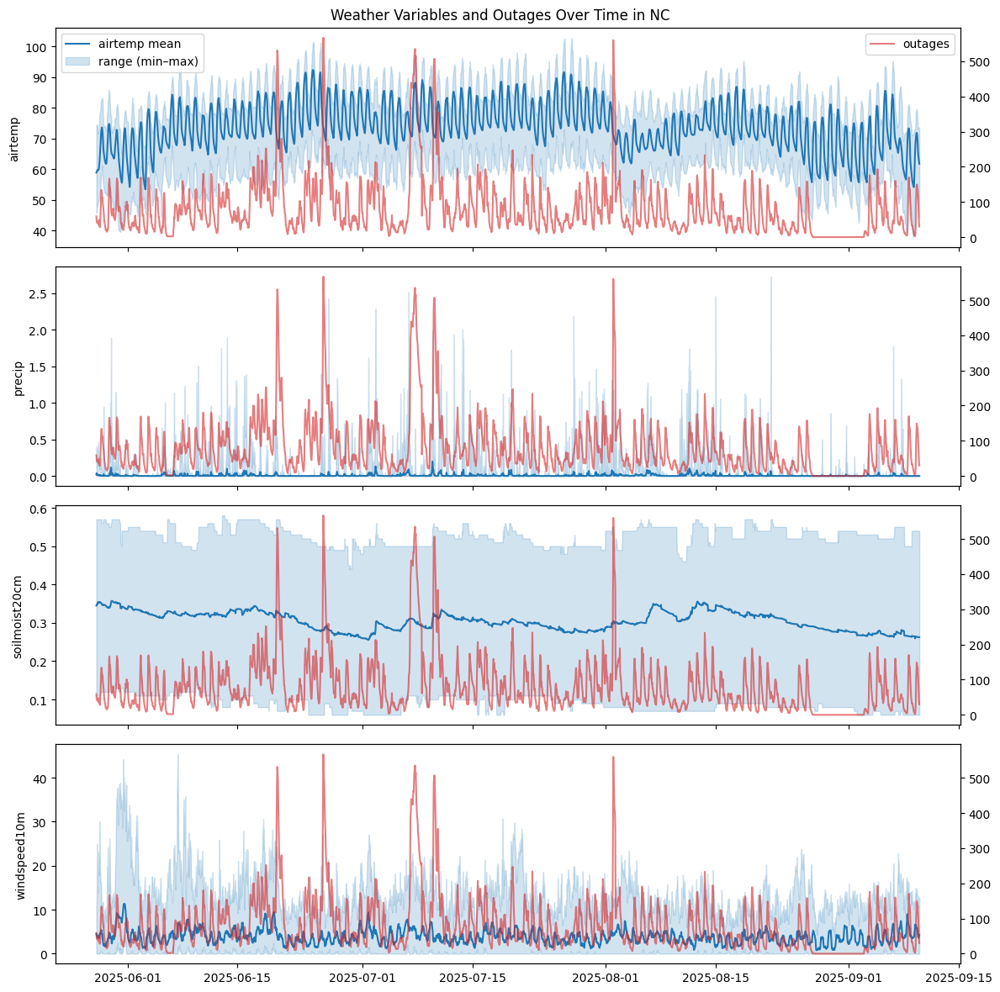

In [ ]:
#Aggregating weather data
agg_weather = (
    weather_ordered
    .groupby('timestamp')
    .agg({
        'airtemp': ['mean', 'min', 'max'],
        'precip': ['mean', 'min', 'max'],
        'soilmoist20cm': ['mean', 'min', 'max'],
        'windspeed10m': ['mean', 'min', 'max']
    })
)

# Flatten multiindex columns (except timestamp, which is the index)
agg_weather.columns = [f'{col[0]}_{col[1]}' for col in agg_weather.columns]
agg_weather = agg_weather.reset_index()  # timestamp becomes a normal column

# Merge with weather data
merged = pd.merge(agg_weather, outages_per_hour, on='timestamp', how='left').fillna(0)

variables = ['airtemp', 'precip', 'soilmoist20cm', 'windspeed10m']
fig, axes = plt.subplots(len(variables), 1, figsize=(12, 12), sharex=True)

for i, var in enumerate(variables):
    ax = axes[i]
    ax.plot(merged['timestamp'], merged[f'{var}_mean'], label=f'{var} mean', color='C0')
    ax.fill_between(
        merged['timestamp'],
        merged[f'{var}_min'],
        merged[f'{var}_max'],
        alpha=0.2,
        label='range (min–max)',
        color='C0'
    )

    # Twin axis for outages
    ax2 = ax.twinx()
    ax2.plot(merged['timestamp'], merged['outage_count'], color='C3', alpha=0.6, label='outages')

    ax.set_ylabel(var)
    if i == 0:
        ax.legend(loc='upper left')
        ax2.legend(loc='upper right')

plt.xlabel('Timestamp')
plt.suptitle('Weather Variables and Outages Over Time in NC')
plt.tight_layout()
plt.show()


In [ ]:
#Parameters
LAT_LON_DECIMALS = 6   #change to 4 or 3 to cluster more aggressively
TOP_N = 20             #how many top devices to display

#Copy & clean base data
out = outages_NC.copy()
out['outage_start_estimate'] = pd.to_datetime(out['outage_start_estimate'], errors='coerce')
out['fix_duration_hours'] = pd.to_numeric(out['fix_duration_hours'], errors='coerce')

#Overall summary
overall = pd.DataFrame({
    "total_outages": [len(out)],
    "total_duration_hours": [out['fix_duration_hours'].sum(skipna=True)],
    "avg_duration_hours": [out['fix_duration_hours'].mean(skipna=True)],
    "median_duration_hours": [out['fix_duration_hours'].median(skipna=True)],
    "max_duration_hours": [out['fix_duration_hours'].max(skipna=True)]
})
print("=== Overall Summary ===")
print(overall, "\n")

#Build device_loc from lat/lon (fallback to outage_identifer)
lat_col = 'device_lat'
lon_col = 'device_lon'
id_col = 'outage_identifer'   # per your dataset spelling

# coerce lat/lon if present
if lat_col in out.columns and lon_col in out.columns:
    out[lat_col] = pd.to_numeric(out[lat_col], errors='coerce')
    out[lon_col] = pd.to_numeric(out[lon_col], errors='coerce')
    out['device_loc'] = np.where(
        out[lat_col].notna() & out[lon_col].notna(),
        out[lat_col].round(LAT_LON_DECIMALS).astype(str) + "," + out[lon_col].round(LAT_LON_DECIMALS).astype(str),
        np.nan
    )
else:
    out['device_loc'] = np.nan

#fallback to identifier where lat/lon missing
if id_col in out.columns:
    out['device_loc'] = out['device_loc'].fillna(out[id_col].astype(str))
else:
    out['device_loc'] = out['device_loc'].fillna('unknown')

#Device-level stats (by device_loc)
device_stats = (
    out.groupby('device_loc', dropna=False)
       .agg(
           outage_count=('device_loc', 'size'),
           avg_duration_hours=('fix_duration_hours', 'mean'),
           total_duration_hours=('fix_duration_hours', 'sum'),
           max_duration_hours=('fix_duration_hours', 'max'),
           n_missing_latlon=(lat_col, lambda s: s.isna().sum() if lat_col in out.columns else 0)
       )
       .sort_values('outage_count', ascending=False)
)

#Add weekday/weekend counts per device
out['_weekday'] = out['outage_start_estimate'].dt.weekday
out['is_weekend'] = out['_weekday'].isin([5,6]).astype(int)
wk = out.groupby(['device_loc','is_weekend']).size().unstack(fill_value=0).rename(columns={0:'weekday_count',1:'weekend_count'})
device_stats = device_stats.merge(wk, left_index=True, right_index=True, how='left').fillna(0)

#Add planned/unplanned counts per device if 'cause' exists
if 'cause' in out.columns:
    out['planned_vs_unplanned'] = out['cause'].fillna('unknown').str.lower().apply(lambda x: 'planned' if 'planned' in x else 'unplanned')
    pvu = out.pivot_table(index='device_loc', columns='planned_vs_unplanned', values='fix_duration_hours', aggfunc='size', fill_value=0)
    #ensure columns exist
    for col in ['planned','unplanned']:
        if col not in pvu.columns:
            pvu[col] = 0
    device_stats = device_stats.merge(pvu, left_index=True, right_index=True, how='left').fillna(0)

#Reset index for nicer display / export
device_stats = device_stats.reset_index().rename(columns={'device_loc':'device_key'})

#If device_key is lat,lon, split back into coords
if lat_col in out.columns and lon_col in out.columns:
    coords = device_stats['device_key'].str.split(',', n=1, expand=True)
    if coords.shape[1] == 2:
        device_stats['device_lat_round'] = coords[0]
        device_stats['device_lon_round'] = coords[1]

# Top devices by count and by total duration
top_by_count = device_stats.sort_values('outage_count', ascending=False).head(TOP_N)
top_by_total_duration = device_stats.sort_values('total_duration_hours', ascending=False).head(TOP_N)

print(f"=== Top {TOP_N} Devices by Outage Count (grouped by lat/lon or identifier) ===")
display(top_by_count)

print(f"\n=== Top {TOP_N} Devices by Total Outage Duration ===")
display(top_by_total_duration)

#Weekday vs Weekend (overall)
weekday_stats = (
    out.groupby('is_weekend')
       .agg(
           outage_count=('device_loc', 'size'),
           avg_duration=('fix_duration_hours', 'mean'),
           total_duration=('fix_duration_hours', 'sum')
       )
       .rename(index={0: 'Weekday', 1: 'Weekend'})
)
print("\n=== Weekday vs Weekend (Overall) ===")
print(weekday_stats, "\n")

#Planned vs Unplanned (overall)
out['cause'] = out['cause'].astype(str).str.lower()
out['planned_vs_unplanned'] = out['cause'].apply(lambda x: 'planned' if 'planned' in x else 'unplanned')
planned_summary = (
    out.groupby('planned_vs_unplanned')
       .agg(
           outage_count=('planned_vs_unplanned', 'size'),
           avg_duration=('fix_duration_hours', 'mean'),
           total_duration=('fix_duration_hours', 'sum')
       )
       .sort_values('outage_count', ascending=False)
)
print("=== Planned vs Unplanned Outages (Overall) ===")
print(planned_summary, "\n")

#Outages by County
county_summary = (
    out.groupby('county')
       .agg(
           outage_count=('county', 'size'),
           avg_duration=('fix_duration_hours', 'mean'),
           total_duration=('fix_duration_hours', 'sum')
       )
       .sort_values('outage_count', ascending=False)
)
print("=== Outages by County ===")
display(county_summary.head(10))

=== Overall Summary ===
   total_outages  total_duration_hours  avg_duration_hours  \
0         343190          1.399052e+06            4.076753   

   median_duration_hours  max_duration_hours  
0               1.500278          699.998889   

=== Top 20 Devices by Outage Count (grouped by lat/lon or identifier) ===


,device_key,outage_count,avg_duration_hours,total_duration_hours,max_duration_hours,n_missing_latlon,weekday_count,weekend_count,planned,unplanned,device_lat_round,device_lon_round
0,"35.1304,-80.8767",69,1.421252,98.066389,10.662778,0,44,25,69,0,35.1304,-80.8767
1,"35.4431,-80.6161",68,1.441528,98.023889,4.844722,0,52,16,68,0,35.4431,-80.6161
2,"35.8147,-79.0868",29,0.513084,14.879444,3.834167,0,29,0,29,0,35.8147,-79.0868
3,"35.2125,-80.9039",29,1.089550,31.596944,4.347222,0,24,5,29,0,35.2125,-80.9039
4,"35.2838,-80.7609",24,0.635208,15.245000,2.831111,0,14,10,24,0,35.2838,-80.7609
5,"35.3603,-80.7143",24,0.771111,18.506667,4.024167,0,24,0,24,0,35.3603,-80.7143
6,"35.7334,-81.3602",24,1.846771,44.322500,5.487778,0,24,0,24,0,35.7334,-81.3602
7,"35.5398,-82.9282",23,0.903394,20.778056,3.498611,0,14,9,23,0,35.5398,-82.9282
8,"35.7281,-81.3602",22,1.050581,23.112778,3.154444,0,22,0,22,0,35.7281,-81.3602
11,"35.1479,-80.893",21,0.463135,9.725833,1.838333,0,15,6,21,0,35.1479,-80.893



=== Top 20 Devices by Total Outage Duration ===


,device_key,outage_count,avg_duration_hours,total_duration_hours,max_duration_hours,n_missing_latlon,weekday_count,weekend_count,planned,unplanned,device_lat_round,device_lon_round
37322,"35.5793,-82.2979",2,500.418056,1000.836111,699.998889,0,2,0,2,0,35.5793,-82.2979
26668,"35.2479,-82.3172",2,226.084583,452.169167,448.153056,0,2,0,2,0,35.2479,-82.3172
136933,"36.158,-79.3355",1,447.321667,447.321667,447.321667,0,1,0,1,0,36.158,-79.3355
6344,"35.9305,-82.1118",4,96.909306,387.637222,192.669444,0,3,1,4,0,35.9305,-82.1118
17249,"35.5487,-82.2618",3,125.887593,377.662778,301.837222,0,3,0,3,0,35.5487,-82.2618
33458,"35.5012,-82.2702",2,183.758889,367.517778,366.501667,0,0,2,2,0,35.5012,-82.2702
193289,"35.5591,-82.3182",1,366.337222,366.337222,366.337222,0,0,1,1,0,35.5591,-82.3182
2759,"35.6025,-82.3277",5,70.341000,351.705000,201.335000,0,3,2,5,0,35.6025,-82.3277
191534,"35.5251,-82.2509",1,301.837222,301.837222,301.837222,0,1,0,1,0,35.5251,-82.2509
16195,"35.3419,-82.4685",3,95.760833,287.282500,96.926389,0,3,0,3,0,35.3419,-82.4685



=== Weekday vs Weekend (Overall) ===
            outage_count  avg_duration  total_duration
is_weekend                                            
Weekday           278015      4.415729    1.227586e+06
Weekend            65175      2.630853    1.714659e+05 

=== Planned vs Unplanned Outages (Overall) ===
                      outage_count  avg_duration  total_duration
planned_vs_unplanned                                            
planned                     343190      4.076753    1.399052e+06 

=== Outages by County ===


,outage_count,avg_duration,total_duration
county,,,
Mecklenburg County,35729,4.526657,161728.397500
Buncombe County,25770,6.820135,175754.870556
Wake County,24556,1.674755,41125.280556
Guilford County,15883,3.045750,48372.601667
Henderson County,14272,8.146936,116264.930556
Forsyth County,10675,3.060449,32670.293889
Durham County,9726,2.255643,21938.383056
New Hanover County,7804,1.720950,13428.573889
Catawba County,6896,6.579465,45365.407778


In [29]:
print(out[out['outage_identifer'] == 5944632])


        outage_identifer  device_lat  device_lon    block_fips convex_hull  \
159844           5944632     35.5793    -82.2979  3.702100e+14         NaN   

       jurisdiction       origin           state           county  affected  \
159844          DEC  Duke Energy  North Carolina  Buncombe County         1   

            cause outage_start_estimate outage_end_estimate  \
159844  unplanned   2024-12-11 21:10:43 2025-01-10 01:10:40   

       fix_duration_estimate outage_restored  fix_duration_hours  weekday  \
159844        29d 3h 59m 56s               t          699.998889        2   

        is_weekend planned_vs_unplanned  
159844           0              planned  


# Ignore below for now

builds hourly outage rows for each outage (outage_start_estimate → outage_end_estimate, inclusive),

finds the nearest weather station by Haversine distance using device_lat / device_lon,

attaches only the weather rows for that nearest station at the outage-hour timestamps,

outputs outages_with_nearest_station_hourly_weather.csv

In [6]:
# ---------- Config (uses your exact column names) ----------
WEATHER_DF = weather_ordered   # must already be loaded
OUTAGES_DF = outages_NC        # must already be loaded

OUTAGE_LAT_COL = "device_lat"
OUTAGE_LON_COL = "device_lon"
OUTAGE_START_COL = "outage_start_estimate"
OUTAGE_END_COL = "outage_end_estimate"
OUTAGE_ID_COL = "outage_identifer"  # note spelling from your list

WEATHER_VARS = ["airtemp", "precip", "soilmoist20cm", "windspeed10m"]

# ---------- Helpers ----------
def haversine_km_vec(lat1, lon1, lat2_arr, lon2_arr):
    """
    Compute great-circle (haversine) distance from (lat1, lon1)
    to arrays lat2_arr/lon2_arr. Returns distances in kilometers.
    """
    R = 6371.0  # Earth's radius in kilometers

    # Convert all angles to radians
    lat1 = np.radians(lat1)
    lon1 = np.radians(lon1)
    lat2_arr = np.radians(lat2_arr)
    lon2_arr = np.radians(lon2_arr)

    # Vectorized haversine formula
    dlat = lat2_arr - lat1
    dlon = lon2_arr - lon1

    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2_arr) * np.sin(dlon / 2)**2
    c = 2 * np.arcsin(np.sqrt(a))

    return R * c

# ---------- Prepare station coords (unique per station) ----------
# ensure weather timestamps are datetimes
WEATHER_DF["timestamp"] = pd.to_datetime(WEATHER_DF["timestamp"])

station_coords = (WEATHER_DF[["station", "latitude", "longitude"]]
                  .drop_duplicates(subset=["station"])
                  .set_index("station"))

stations_list = station_coords.index.to_list()
stations_lat = station_coords["latitude"].to_numpy(dtype=float)
stations_lon = station_coords["longitude"].to_numpy(dtype=float)

def find_nearest_station(lat, lon):
    # handle missing coords
    if pd.isna(lat) or pd.isna(lon):
        return None, np.nan
    # compute distances to all stations (vectorized)
    valid = ~np.isnan(stations_lat) & ~np.isnan(stations_lon)
    if not np.any(valid):
        return None, np.nan
    dists = haversine_km_vec(lat, lon, stations_lat[valid], stations_lon[valid])
    min_idx = np.argmin(dists)
    station_name = np.array(stations_list)[valid][min_idx]
    return station_name, float(dists[min_idx])

# ---------- ASSIGN OUTAGES TO WEATHER ROWS (station + overlap) ----------

# If outages don't yet have nearest_station computed, compute it once for each outage
# (this uses the station_coords computed earlier; ensure station_coords/stations_* exist)
if "nearest_station" not in OUTAGES_DF.columns:
    # reuse station_coords/stations_list from your script; if not present, rebuild:
    station_coords = (WEATHER_DF[["station", "latitude", "longitude"]]
                      .drop_duplicates(subset=["station"])
                      .set_index("station"))
    stations_list = station_coords.index.to_list()
    stations_lat = station_coords["latitude"].to_numpy(dtype=float)
    stations_lon = station_coords["longitude"].to_numpy(dtype=float)

    def find_nearest_station_simple(lat, lon):
        if pd.isna(lat) or pd.isna(lon):
            return None, np.nan
        valid = ~np.isnan(stations_lat) & ~np.isnan(stations_lon)
        if not np.any(valid):
            return None, np.nan
        dists = haversine_km_vec(lat, lon, stations_lat[valid], stations_lon[valid])
        min_idx = np.argmin(dists)
        station_name = np.array(stations_list)[valid][min_idx]
        return station_name, float(dists[min_idx])

    OUTAGES_DF["nearest_station"] = None
    OUTAGES_DF["station_distance_km"] = np.nan
    for i, row in OUTAGES_DF.iterrows():
        st, d = find_nearest_station_simple(row[OUTAGE_LAT_COL], row[OUTAGE_LON_COL])
        OUTAGES_DF.at[i, "nearest_station"] = st
        OUTAGES_DF.at[i, "station_distance_km"] = d

# Prepare for merge: keep relevant outage cols
outage_keep = [
    OUTAGE_ID_COL,
    OUTAGE_START_COL,
    OUTAGE_END_COL,
    OUTAGE_LAT_COL,
    OUTAGE_LON_COL,
    "nearest_station",
    "station_distance_km",
]
outage_keep = [c for c in outage_keep if c in OUTAGES_DF.columns]
outages_for_merge = OUTAGES_DF[outage_keep].copy()

# Merge weather rows to all outages for the same station (this is the key many-to-many)
merged = WEATHER_DF.merge(
    outages_for_merge,
    left_on="station",
    right_on="nearest_station",
    how="left",
    suffixes=("", "_outage")
)

# Now filter by time overlap: weather.timestamp must be within [start, end]
# If outage end is missing or < start, treat end == start (point outage)
merged[OUTAGE_END_COL] = merged[OUTAGE_END_COL].fillna(merged[OUTAGE_START_COL])
time_mask = (
    merged["timestamp"].notna()
    & merged[OUTAGE_START_COL].notna()
    & (merged["timestamp"] >= merged[OUTAGE_START_COL])
    & (merged["timestamp"] <= merged[OUTAGE_END_COL])
)

# Keep only overlapping pairs
overlaps = merged[time_mask].copy()

#Group by the original weather row index columns (station + timestamp). If WEATHER_DF has a unique index,
# reset it and use it; otherwise use station+timestamp as a key.
WEATHER_DF = WEATHER_DF.reset_index(drop=False)  # keep old index in column 'index' if needed
merged = merged.reset_index(drop=True)
overlaps = overlaps.reset_index(drop=True)

group_cols = ["station", "timestamp"]
agg = overlaps.groupby(group_cols).agg(
    matched_outage_ids = (OUTAGE_ID_COL, lambda s: list(s.dropna().astype(str).unique())),
    matched_outage_count = (OUTAGE_ID_COL, lambda s: int(s.dropna().nunique())),
    matched_outage_details = (OUTAGE_ID_COL, lambda s: [
        {"outage_id": oid,
         "start": row_start,
         "end": row_end,
         "outage_lat": row_lat,
         "outage_lon": row_lon,
         "distance_km": dist}
        for oid, row_start, row_end, row_lat, row_lon, dist in zip(
            overlaps[OUTAGE_ID_COL], overlaps[OUTAGE_START_COL], overlaps[OUTAGE_END_COL],
            overlaps.get(OUTAGE_LAT_COL, pd.Series([np.nan]*len(overlaps))),
            overlaps.get(OUTAGE_LON_COL, pd.Series([np.nan]*len(overlaps))),
            overlaps.get("station_distance_km", pd.Series([np.nan]*len(overlaps)))
        )
    ])
).reset_index()

# Left-join the aggregated outage info back to WEATHER_DF
weather_with_outages = WEATHER_DF.merge(
    agg,
    on=group_cols,
    how="left"
)

# Create convenience columns
weather_with_outages["matched_outage_ids"] = weather_with_outages["matched_outage_ids"].apply(lambda x: x if isinstance(x, list) else [])
weather_with_outages["matched_outage_count"] = weather_with_outages["matched_outage_count"].fillna(0).astype(int)
weather_with_outages["is_outage"] = weather_with_outages["matched_outage_count"] > 0

print("Weather rows:", WEATHER_DF.shape[0])
print("Weather rows that overlap any outage:", weather_with_outages["is_outage"].sum())
print(weather_with_outages[["station","timestamp","is_outage","matched_outage_count","matched_outage_ids"]].head(10))

: 